In [2]:
import pickle
import pandas as pd
import gensim
import csv
import random
from matplotlib import pyplot as plt

/home/nicholas/.local/lib/python3.6/site-packages/smart_open/ssh.py:34: UserWarning: paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress
  warnings.warn('paramiko missing, opening SSH/SCP/SFTP paths will be disabled.  `pip install paramiko` to suppress')


In [3]:
with open('../../data/tensor3.pkl', 'rb') as f:
    data = pickle.load(f)

In [3]:
data


D00290.003_SELEX_ALX3  D00292.001_SELEX_ALX4  \
100007_raw 1-0                  0.233633              -0.009496   
           1-1                 -0.258342               0.029549   
           1-10                46.199988               3.475145   
           1-100               60.051663              29.272099   
           1-1000              -2.685523             -14.813843   
           1-1001               4.705516              -4.780305   
           1-1002             -13.771291             -11.619157   
           1-1003              20.214893              -3.467312   
           1-1004              -4.244517              -2.570786   
           1-1005               0.366445              -3.491856   
           1-1006               9.011455              -1.103790   
           1-1007               8.499811              -1.974816   
           1-1008             -10.992522              14.601011   
           1-1009               7.340064               7.593170   
           1-101               -9.906465             -14.264758   
           1-1010              -0.754833               5.334964   
           1-1011               3.534911               2.262487   
           1-1012              -0.543469              -3.467030   
           1-1013              10.209665              12.702922   
           1-1014              -7.313896              -4.764818   
           1-1015              -7.532110             -10.523312   
           1-1016             -14.359990              -1.300698   
           1-1017              -4.872284             -14.158611   
           1-1018              14.344668               4.876861   
           1-1019               1.512960               1.109143   
           1-102               -7.038123              -2.424674   
           1-1020              -9.856186             -12.745503   
           1-1021             -24.624511              -2.227445   
           1-1022             -27.969493               4.200149   
           1-1023               2.257808               6.001280   
...                                  ...                    ...   
757_irnt   1-972                0.647797              -5.871198   
           1-973               25.004408               4.373124   
           1-974              -17.571871               2.570175   
           1-975                3.541156               7.600391   
           1-976               -4.398430              10.233435   
           1-977               -0.653355              -4.477253   
           1-978              -18.002176             -18.290009   
           1-979              -20.552192              42.432979   
           1-98                -4.576515              -5.417648   
           1-980               19.539144              20.042327   
           1-981               -0.794316              14.488653   
           1-982               10.200321             -35.412684   
           1-983               28.786365              -6.123262   
           1-984               90.977924             -27.430215   
           1-985               20.879767               1.830986   
           1-986                3.014047              12.666719   
           1-987               -6.549366               0.629852   
           1-988               -0.527058               4.274955   
           1-989                1.748537              -1.750331   
           1-99                -7.788918              -7.611569   
           1-990               -2.868851              -0.182491   
           1-991               -5.938324               2.493521   
           1-992              -15.769198               2.132362   
           1-993               36.513615              41.116373   
           1-994               -6.268132              -2.855267   
           1-995              -18.286816              -7.105736   
           1-996               10.212257               7.599330   
           1-997                5.432915               6.404061   

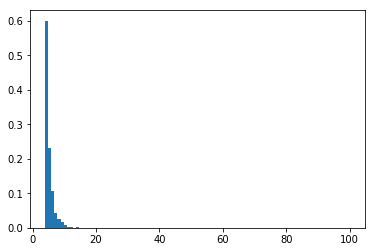

-8.963834833202013e-18 0.9999984689944583 21.614962957204884


In [60]:
import matplotlib.pyplot as plt
import numpy as np
blah = np.array(data['D00571.002_SELEX_PAX2'])
blah
plt.hist(blah, bins=100, density=True, range=(4,100))
plt.show()
print(np.mean(blah), np.std(blah), np.max(blah))

In [4]:
for column in data.columns:
    data[column] = (data[column] - data[column].mean())/data[column].std()


In [5]:
code_mapper = {}
with open('../../data/gwas_names.csv', 'r') as f:
    reader = csv.reader(f)
    for row in reader:
        code = row[0]
        name = row[1]
        code_mapper[code] = name

In [26]:
thresh = 5
documents = {}
word_counts = {}
for index, row in data.iterrows():
    disease, location = index
    for tf, score in row.iteritems():
        if abs(score) > thresh:
            disease_name = code_mapper.get(disease, disease)
            doc_key = str(location)
            word_key = str((disease_name, tf))
            if doc_key not in documents:
                documents[doc_key] = []
            documents[doc_key].append(word_key)
            if word_key not in word_counts:
                word_counts[word_key] = 0
            word_counts[word_key] += 1
    

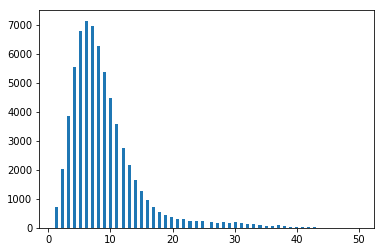

1878 67027 50
50


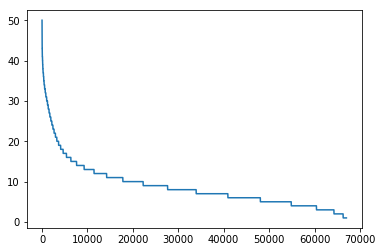

In [28]:
top_words = sorted(word_counts.items(), key=lambda a: -a[1])
counts = [count for word, count in top_words]
plt.hist(counts, 100)
plt.show()
print(len(documents), len(word_counts), max(counts))
print(max(counts))
plt.plot(counts)

In [31]:
stop_word_thresh = 15
for doc_key, original_word_keys in documents.items():
    filtered_word_keys = []
    for i, word_key in enumerate(original_word_keys):
        if word_counts[word_key] <= 15:
            filtered_word_keys.append(word_key)
    documents[doc_key] = filtered_word_keys

In [32]:
keys = sorted(documents.keys(), key=lambda a: int(a.split('-')[1]))

In [33]:
cmp = lambda kv: int(kv[0].split('-')[1])
dct = gensim.corpora.Dictionary(documents.values())
kvs = list(documents.items())
random.shuffle(kvs)
kvs_test = kvs[:len(kvs) // 10]
kvs_train = kvs[len(kvs) // 10:]
kvs.sort(key=cmp)
kvs_train.sort(key=cmp)
kvs_test.sort(key=cmp)
corpus = [dct.doc2bow(text) for key, text in kvs]
corpus_train = [dct.doc2bow(text) for key, text in kvs_train]
corpus_test = [dct.doc2bow(text) for key, text in kvs_test]

genomic_locations = [cmp(kv) for kv in kvs]
print(genomic_locations)

[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 138, 139, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 167, 168, 172, 173, 174, 175, 176, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 234, 235, 236, 237, 238, 239, 240, 241, 243, 244, 245, 246, 248, 250, 25

In [69]:
for kv in kvs:
    print(kv)
    import time
    time.sleep(0.001)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('1-146', ["('Polyunsaturated fat', 'D00318.001_SELEX_CEBPD')", "('Polyunsaturated fat', 'D00320.001_SELEX_CEBPG')", "('Polyunsaturated fat', 'D00340.003_SELEX_DMBX1')", "('Polyunsaturated fat', 'D00351.006_SELEX_EGR1')", "('Polyunsaturated fat', 'D00411.003_SELEX_GATA4')", "('Polyunsaturated fat', 'D00431.002_SELEX_HESX1')", "('Polyunsaturated fat', 'D00454.003_SELEX_HOXB13')", "('Polyunsaturated fat', 'D00481.003_SELEX_IRX2')", "('Polyunsaturated fat', 'D00492.003_SELEX_LEF1')", "('Polyunsaturated fat', 'D00507.002_SELEX_MEF2D')", "('Polyunsaturated fat', 'D00522.002_SELEX_MNX1')", "('Polyunsaturated fat', 'D00527.003_SELEX_MTF1')", "('Polyunsaturated fat', 'D00552.002_SELEX_NR2C2')", "('Polyunsaturated fat', 'D00556.003_SELEX_NR3C1')", "('Polyunsaturated fat', 'D00559.006_ChIP-seq_NRF1')", "('Polyunsaturated fat', 'D00636.003_SELEX_SNAI2')", "('Polyunsaturated fat', 'D00642.003_SELEX_SOX18')", "('Polyunsaturated fat', 'D00650.005_SELEX_SP1')", "('Polyunsaturated fat', 'D00669.002_SE

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('1-333', ["('Drinking water intake', 'D00525.002_SELEX_MSX2')", "('Drinking water intake', 'D00561.001_SELEX_OLIG1')", "('Frequency of light DIY in last 4 weeks', 'D00532.003_SELEX_NEUROG2')", "('Frequency of light DIY in last 4 weeks', 'D00537.001_SELEX_NFIB')", "('Frequency of light DIY in last 4 weeks', 'D00561.001_SELEX_OLIG1')", "('Sweets intake', 'D00411.003_SELEX_GATA4')", "('Sweets intake', 'D00525.002_SELEX_MSX2')", "('Sweets intake', 'D00561.001_SELEX_OLIG1')", "('Sweets intake', 'D00562.006_SELEX_OLIG2')", "('Sweets intake', 'D00563.002_SELEX_OLIG3')", "('Sweets intake', 'D00619.007_ChIP-seq_RFX5')", "('Sweets intake', 'D00776.005_ChIP-seq_JUND')", "('Frequency of friend/family visits', 'D00310.002_SELEX_BHLHE22')", "('Frequency of friend/family visits', 'D00411.003_SELEX_GATA4')", "('Frequency of friend/family visits', 'D00532.003_SELEX_NEUROG2')", "('Frequency of friend/family visits', 'D00537.001_SELEX_NFIB')", "('Frequency of friend/family visits', 'D00561.001_SELEX_OLI

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



('1-527', ["('Drinking water intake', 'D00506.003_SELEX_MEF2B')", "('Pulse rate- automated reading', 'D00506.003_SELEX_MEF2B')", "('Pulse rate- automated reading', 'D00577.002_SELEX_PAX9')", "('Frequency of friend/family visits', 'D00423.005_SELEX_GMEB2')", "('Frequency of friend/family visits', 'D00506.003_SELEX_MEF2B')", "('Frequency of friend/family visits', 'D00577.002_SELEX_PAX9')", "('Fruit consumers', 'D00506.003_SELEX_MEF2B')", "('Morning/evening person (chronotype)', 'D00368.007_SELEX_EN2')", "('Morning/evening person (chronotype)', 'D00416.005_SELEX_GBX2')", "('Morning/evening person (chronotype)', 'D00485.004_SELEX_ISX')", "('Morning/evening person (chronotype)', 'D00613.002_SELEX_RAX')", "('Nap during day', 'D00570.002_SELEX_PAX1')", "('Nap during day', 'D00574.006_ChIP-seq_PAX5')", "('Alcohol intake frequency.', 'D00570.002_SELEX_PAX1')", "('Handedness (chirality/laterality): Right-handed', 'D00368.007_SELEX_EN2')", "('Handedness (chirality/laterality): Right-handed', 'D00

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [34]:
num_topics = 10
lda = gensim.models.LdaModel(corpus, num_topics=num_topics, id2word=dct)

In [79]:
best_model = None
best_perplex = float('inf')
for num_topics in range(1, 101, 5):
    lda = gensim.models.LdaModel(corpus_train, num_topics=num_topics, id2word=dct)
    perplex = lda.log_perplexity(corpus_test)
    print(num_topics, perplex)
    
    if perplex < best_perplex:
        best_model = lda
        best_perplex = perplex

1 -10.695703710118467
6 -11.61940196182688
11 -12.672885283421936
16 -13.796571240361802
21 -14.965822468177173
26 -16.169218611972084
31 -17.395497106324147
36 -18.643800063077347


KeyboardInterrupt: 

In [35]:
for idx, topic in lda.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.000*"(' Prospective memory result', 'D00647.002_SELEX_SOX7')" + 0.000*"('ECG- heart rate', 'D00647.002_SELEX_SOX7')" + 0.000*"(' Recent feelings of tiredness or low energy', 'D00709.002_SELEX_XBP1')" + 0.000*"(' Ever self-harmed', 'D00557.002_SELEX_NR3C2')" + 0.000*"('Non-cancer illness code- self-reported: high cholesterol', 'D00635.001_SELEX_SMAD3')" + 0.000*"(' Prospective memory result', 'D00709.002_SELEX_XBP1')" + 0.000*"('Non-cancer illness code- self-reported: heart/cardiac problem', 'D00709.002_SELEX_XBP1')" + 0.000*"('Mood swings', 'D00645.006_SELEX_SOX2')" + 0.000*"('Non-cancer illness code- self-reported: polymyalgia rheumatica', 'D00765.001_ChIP-seq_GATA1')" + 0.000*"('Pulse rate- automated reading', 'D00644.003_SELEX_SOX21')"
Topic: 1 Word: 0.000*"('Non-cancer illness code- self-reported: high cholesterol', 'D00570.002_SELEX_PAX1')" + 0.000*"('Non-cancer illness code- self-reported: vertigo', 'D00378.007_SELEX_ETS1')" + 0.000*"('Non-cancer illness code- se

In [37]:
enhancers = []
with open('../../data/enhancers.tsv', 'r') as f:
    skip = True
    for line in f:
        if skip:
            skip = False
            continue
        tokens = line.split()
        start = tokens[2]
        end = tokens[3]
        binn = tokens[0]
        if int(binn) <8:
            continue
        
        if 'enh' in tokens[4].lower():
            enhancers.append(int(start)//100000)
            
enhancers = sorted(enhancers)
enhancers
        
        

[14,
 86,
 96,
 99,
 186,
 222,
 254,
 277,
 289,
 349,
 368,
 399,
 418,
 423,
 443,
 462,
 524,
 643,
 668,
 850,
 853,
 888,
 914,
 945,
 1017,
 1018,
 1097,
 1116,
 1121,
 1142,
 1156,
 1166,
 1170,
 1551,
 1599,
 1606,
 1608,
 1675,
 1686,
 1723,
 1735,
 1752,
 1810,
 1825,
 1862,
 1925,
 2002,
 2027,
 2032,
 2034,
 2063,
 2068,
 2098,
 2124,
 2221,
 2268,
 2347,
 2350,
 2351,
 2354,
 2451,
 2461]

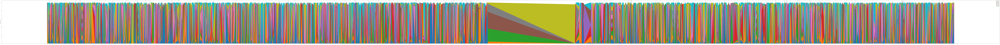

In [38]:
import matplotlib.pyplot as plt
import numpy as np

start = 0
ncorpus = len(corpus)
dists = np.zeros((num_topics, ncorpus))

for i, document in enumerate(corpus[start : start + ncorpus]):
    dist = lda[document]
    for topic, percentage in dist:
        dists[topic, i] = percentage


plt.figure(figsize=(450,20))
plt.xlabel('location')
plt.ylabel('topic distribution')
label_array = ["cluster " + str(i) for i in range(num_topics)]
for xc in enhancers:
    plt.axvline(x=xc, color='black')

plt.stackplot(genomic_locations, dists, labels=label_array)
plt.legend()
plt.show()

In [36]:
import operator
diseases = [{} for i in range(num_topics)]
tfs = [{} for i in range(num_topics)]

for idx in range(num_topics):
    topic = lda.show_topic(idx, 2000)
    topic
    for value, prob in topic:
        disease, tf = eval(value)
        if disease not in diseases[idx]:
            diseases[idx][disease] = 0
        if tf not in tfs[idx]:
            tfs[idx][tf] = 0
        diseases[idx][disease] += prob
        tfs[idx][tf] += prob

top_diseases = [sorted(x.items(), key=operator.itemgetter(1), reverse=True) for x in diseases]
top_tfs = [sorted(x.items(), key=operator.itemgetter(1), reverse=True) for x in tfs]

for idx in range(num_topics):
    print('Topic %d' % idx)
    print(top_diseases[idx][0:5])
    print(top_tfs[idx][:5])

Topic 0
[('Nap during day', 0.002159875828510849), ('Mood swings', 0.002002854995225789), ('Fluid intelligence score', 0.001972934893274214), ('Sleep duration', 0.001592499695107108), ('Mean time to correctly identify matches', 0.0015646408719476312)]
[('D00557.002_SELEX_NR3C2', 0.0016164488006324973), ('D00375.003_SELEX_ESRRB', 0.0014750819427717943), ('D00556.003_SELEX_NR3C1', 0.0013403870252659544), ('D00709.002_SELEX_XBP1', 0.0013305428583407775), ('D00700.001_SELEX_USF1', 0.0011675888927129563)]
Topic 1
[('Non-cancer illness code- self-reported: hypertension', 0.003485714663838735), ('Nap during day', 0.0021741681375715416), ('Ease of skin tanning', 0.0021440450691443402), ('Sleep duration', 0.0019245202165620867), ('Morning/evening person (chronotype)', 0.0018323449767194688)]
[('D00712.002_SELEX_ZBED1', 0.0013384757367020939), ('D00685.003_SELEX_TFCP2', 0.0011863743602589238), ('D00537.001_SELEX_NFIB', 0.0010738984383351635), ('D00559.001_SELEX_NRF1', 0.0010450807021697983), ('D

10